In [91]:
import os
import re
import random

import numpy as np
import cv2
from tqdm import tqdm
from matplotlib import rcParams
import matplotlib.pyplot as plt

import tools

rcParams['figure.figsize'] = 108, 192

Get data

In [92]:
path_data = r'C:\Users\79614\Desktop\train' #set YOUR_PATH_DATA
name_files = os.listdir(path_data)
txt_data = sorted(list(filter(re.compile(".*txt").match, name_files)))
img_data = sorted(list(filter(re.compile(".*jpg").match, name_files)))

Check the number of images 

In [93]:
print (f'Number of image: {len(img_data)}')

Number of image: 3222


Check the shape of images

In [82]:
random_img = random.choice(img_data)
shape = cv2.imread(f'{path_data}/{random_img}').shape
count_ok = 0
for img_ in tqdm(img_data):
    img_np = cv2.imread(f'{path_data}/{img_}')
    if img_np.shape == shape:
        count_ok += 1
    else:
        print(f'Other shape: {img_}')


100%|██████████████████████████████████████████████████████████████████████████████| 3222/3222 [01:44<00:00, 30.95it/s]


In [94]:
count_ok == len(img_data)

True

We need to look at the images and understand what we need to detect

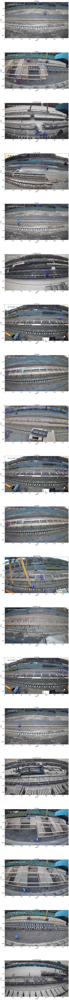

In [97]:
count_image = 20
img_show = random.choices(img_data, k=count_image)
f, axarr = plt.subplots(count_image,1)
for id, img_ in enumerate(img_show):
    img_np = cv2.imread(f'{path_data}/{img_}')
    info_objs = tools.bbox_px_format(f'{path_data}/{img_[:-4]}.txt', img_np.shape[1], img_np.shape[0])
    for obj in info_objs:
        start = (obj[1]-int(obj[3]//2), obj[2]-int(obj[4]//2))
        stop = (obj[1]+int(obj[3]//2), obj[2]+int(obj[4]//2))
        if obj[0] == 0:
            color = (255, 0, 0)
        elif obj[0] == 1:
            color = (0, 255, 0)
        elif obj[0] == 2:
            color = (0, 0, 255)
        img_np = cv2.rectangle(img_np, start, stop, color=color, thickness=2)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.4, 
                    hspace=0.4)
    axarr[id].set_title(img_)
    axarr[id].set_xlabel('Width')
    axarr[id].set_ylabel('Height')
    axarr[id].imshow(img_np)

Having received this information, we can conclude that 
- The images were taken from the camera on the railroad. 
    - You need to train the model to detect 3 classes. 0 - uniform 1 - helmet 2 - human.  
- This task is to verify compliance with the rules of the workers
- Shape of all images HxWxC - (1080, 1920, 3)
- The images are taken during the day.
- Some images do not have a single object.
- I checked 100 images with markup. All of them were valid. Let's make the assumption that all the markup is done correctly.